### **Welcome to the Logistic Regression Notebook!**

Hi! We'll be creating a logistic regression model to predict diabetes from clinical variables. 

What you need to know in advance: nothing!

What you will learn:
* How to **Preprocess** and Analyze Structured Data 
* **Exploratory** Data Analysis (Cool Plots!!)
* The **math** behind logistic regression (e.g. statistics, a TINY bit of calculus that I will help you understand)
* How to Construct, Modify, Train, and Evaluate an end-to-end **Logistic Regression Model for On-Demand Diabetes Diagnosis**
* How to **Interpret** Your Model to Understand the Biological Basis of Diabetes

In [1]:
# A LOT of machine learning models can be used just through libraries and 
# packages that allow for easy training!

import pandas as pd # pandas is used for the analysis *.CSV files
import numpy as np # numpy is used to create arrays and manipulate them
from sklearn.model_selection import train_test_split # this is to split our data into training and testing sets
from sklearn.linear_model import LogisticRegression # Our prebuilt logistic regression model
from matplotlib import pyplot as plt # used for plotting cool graphs!


### PREPROCESSING AND EXPLORATORY DATA ANALYSIS

In [2]:
# First, we read in the CSV file and convert it to a Pandas DataFrame
df = pd.read_csv("/kaggle/input/diabetes-prediction-dataset/diabetes_prediction_dataset.csv")

In [3]:
# Now, let's view the first 5 rows:
df.head(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


In [4]:
df["smoking_history"].unique()

array(['never', 'No Info', 'current', 'former', 'ever', 'not current'],
      dtype=object)

In [5]:
# Now, let's check out what variables we're collecting about each individual case.
print(df.columns)

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')


In [6]:
# Some cases might have blank values or NaN (not a number)! 
# We don't want that, so let's remove those cases.
df = df.dropna()

In [7]:
# The values collected for the Gender and Smoking History columns are understandable to us, 
# but not to the machine. We'll be using one-hot encoding to represent them as BINARY vectors.
# Let's define a function to return a categorical integer depending on the value of the variable for an individual case.
def return_gender_binarized(gender: str):
    return 1 if gender == "Female" else 0

def return_smoking_history(smoking_history: str):
    dictionary = {
        "never" : 0, 
        "No Info" : 1, 
        "current" : 2,
        "former" : 3,
        "ever" : 4,
        "not current" : 5
    }
    return dictionary[smoking_history]

In [8]:
# Now, we want to map the values of the variables for each individual case to their integer form.
df["gender"] = df["gender"].map(return_gender_binarized)
df["smoking_history"] = df["smoking_history"].map(return_smoking_history)

In [9]:
# Now, let's check out dataframe!
df.head(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,1,80.0,0,1,0,25.19,6.6,140,0
1,1,54.0,0,0,1,27.32,6.6,80,0
2,0,28.0,0,0,0,27.32,5.7,158,0
3,1,36.0,0,0,2,23.45,5.0,155,0
4,0,76.0,1,1,2,20.14,4.8,155,0


In [10]:
# Now, standardizing data is important to make sure that the model doesn't have to deal with large numbers!
# We will be using standardization (z-score scaling) to accomplish this!
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
columns = ['age','bmi', 'HbA1c_level','blood_glucose_level']
df_scaled = pd.DataFrame(scaler.fit_transform(df[columns]), columns = ['age','bmi', 'HbA1c_level', 
                                                       'blood_glucose_level'])

In [11]:
# Let's now add the categorical variables!
df_scaled["gender"] = df["gender"].tolist()
df_scaled["hypertension"] = df["hypertension"].tolist()
df_scaled["heart_disease"] = df["heart_disease"].tolist()
df_scaled["smoking_history"] = df["smoking_history"].tolist()
df_scaled["diabetes"] = df["diabetes"].tolist()

In [12]:
# Now for all cases, their quantitative variable values are now their z-scores.
# Z-score Formula: (value - mean of column) / standard deviation of column –> ONLY APPLIES TO QUANTITATIVE DATA
# Why Z-scores? Standardizing your data leads to FASTER model convergence, help interpretability, avoid numerical
# instabilities, and act as a form of regularization (avoiding model overfitting). 
df_scaled.head(5)

,age,bmi,HbA1c_level,blood_glucose_level,gender,hypertension,heart_disease,smoking_history,diabetes
0,1.692704,-0.321056,1.001706,0.047704,1,0,1,0,0
1,0.538006,-0.000116,1.001706,-1.426210,1,0,0,1,0
2,-0.616691,-0.000116,0.161108,0.489878,0,0,0,0,0
3,-0.261399,-0.583232,-0.492690,0.416183,1,0,0,2,0
4,1.515058,-1.081970,-0.679490,0.416183,0,1,1,2,0


In [13]:
from sklearn.manifold import TSNE

# Initialize the t-SNE model with desired parameters
tsne = TSNE(n_components=2, perplexity=30, random_state=42)

# Fit and transform the data to the lower-dimensional space
X_tsne = tsne.fit_transform(df_scaled.drop(["diabetes"], axis = 1))


In [14]:
diabetes = df_scaled[df_scaled["diabetes"] == 1]
no_diabetes = df_scaled[df_scaled["diabetes"] == 0]

In [15]:
diabetes = diabetes[0:1000]
no_diabetes = no_diabetes[0:1000]
test_df = pd.concat((diabetes, no_diabetes))

In [16]:
from sklearn.manifold import TSNE

# Initialize the t-SNE model with desired parameters
test_tsne = TSNE(n_components=2, perplexity=30, random_state=42)

# Fit and transform the data to the lower-dimensional space
test_x_tsne = tsne.fit_transform(test_df.drop(["diabetes"], axis = 1))


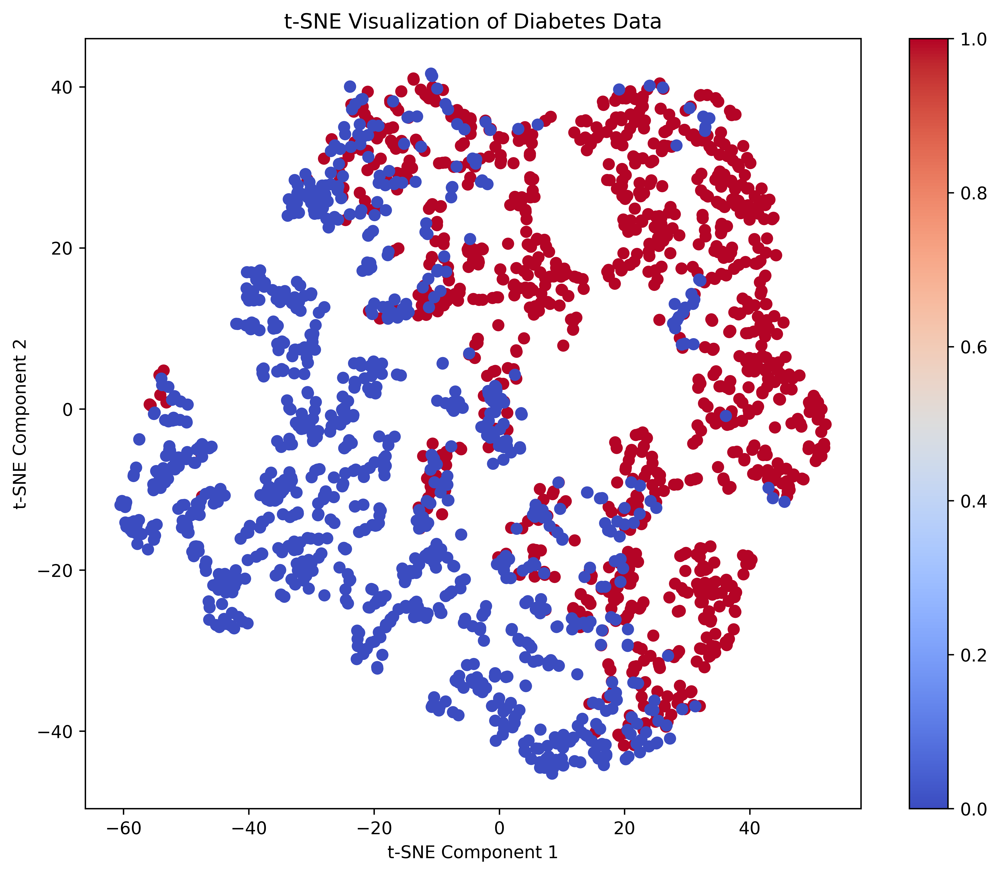

In [17]:
import matplotlib.pyplot as plt

# Create a scatter plot
y = test_df["diabetes"]
plt.figure(figsize=(10, 8))
plt.scatter(test_x_tsne[:, 0], test_x_tsne[:, 1], c=y, cmap='coolwarm')
plt.colorbar()
plt.title('t-SNE Visualization of Diabetes Data')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.gcf().set_dpi(600)
plt.show()


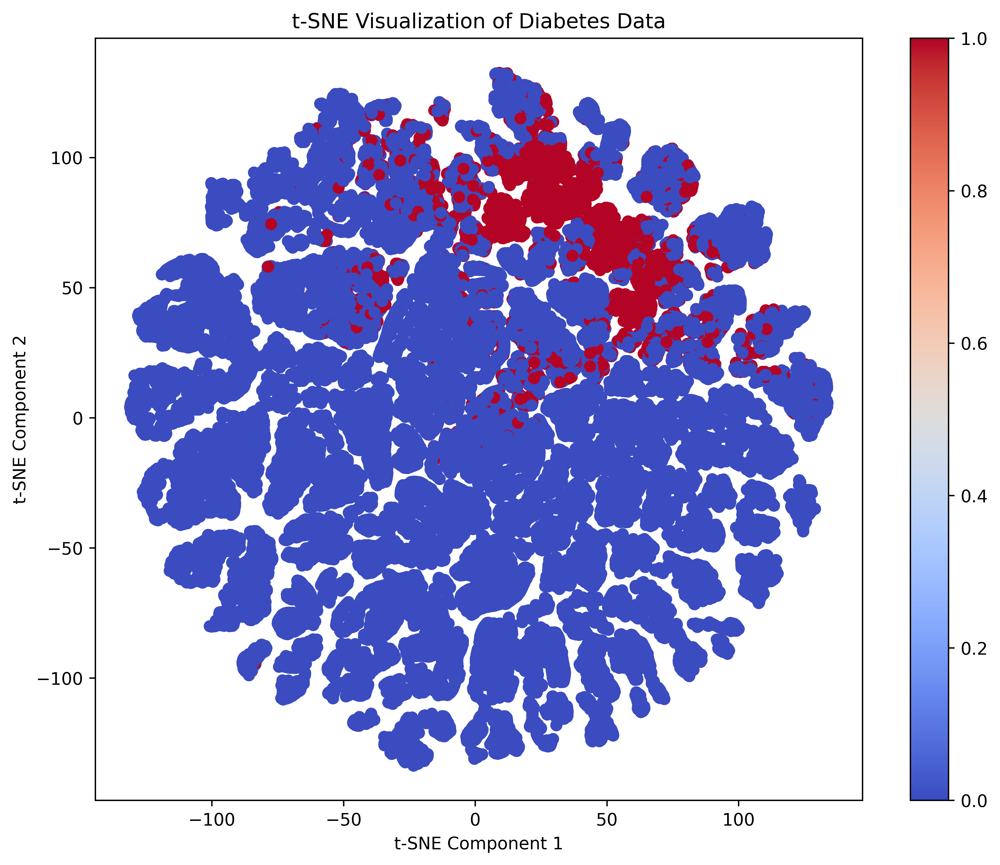

In [18]:
import matplotlib.pyplot as plt

# Create a scatter plot
y = df_scaled["diabetes"]
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='coolwarm')
plt.colorbar()
plt.title('t-SNE Visualization of Diabetes Data')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.gcf().set_dpi(600)
plt.show()


In [19]:
# Now, we wonder if there is a correlation between any of two different QUANTITATIVE variables!
# We can use multiple types of Correlation – Pearson, Spearman Rank, Kendall
# We can also make a pretty neat plot by using the .corr() function in pandas
# NOTE: This is STATISTICS, not necessarily machine learning.
cols = ['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes']
correlation_matrix = pd.DataFrame(df_scaled[cols], columns = cols).corr("pearson")

## What do you see in the heatmap? Try to write down your interpretations!
Keep in mind that a negative correlation means as one variable increases, the other decreases. 
Many of these variables ARE BINARY, so there might not be a measurable "increase" in a value.

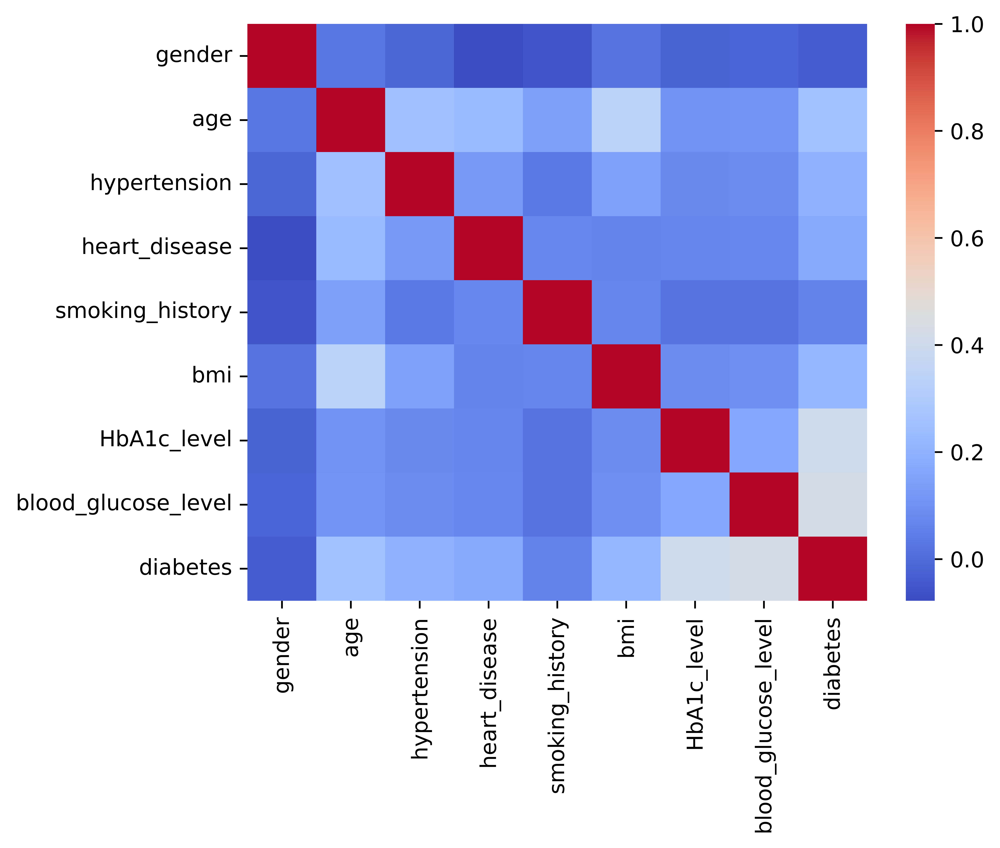

In [20]:
import seaborn as sns 
plt.gcf().set_dpi(1000) # for high-quality plots
sns.heatmap(correlation_matrix, cmap = "coolwarm", annot = False)
plt.savefig("/kaggle/working/corr_matrix.png", dpi = 1000)
plt.show()


In [21]:
# Now, let's take a look at the columns and make some plots of the quantitative and categorical variables.
df_scaled.columns

Index(['age', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'gender',
       'hypertension', 'heart_disease', 'smoking_history', 'diabetes'],
      dtype='object')

In [22]:
print(len(df_scaled))

100000


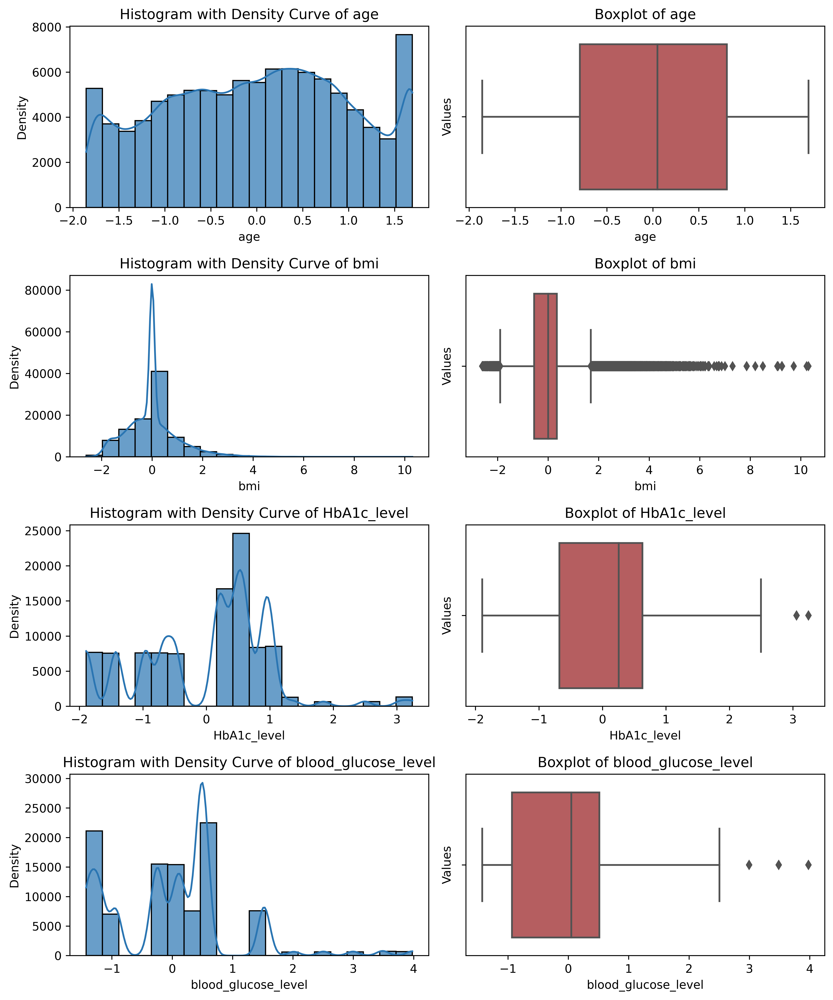

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of quantitative column names you want to plot
quantitative_columns = ['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']

# Set the number of bins for the histograms (adjust as needed)
num_bins = 20

# Create subplots with a shared x-axis
fig, axs = plt.subplots(len(quantitative_columns), 2, figsize=(10, 12))

# Loop through each quantitative column and create a histogram and a boxplot
for i, column in enumerate(quantitative_columns):
    # Plot the histogram
    sns.histplot(data=df_scaled, x=column, bins=num_bins, kde=True, color='#2a75b2', alpha=0.7, fill=True, ax=axs[i, 0])
    
    # Add a boxplot underneath the histogram
    sns.boxplot(data=df_scaled, x=column, color='#c44f52', ax=axs[i, 1], )
    
    # Customize plot labels and title
    axs[i, 0].set_xlabel(column)
    axs[i, 0].set_ylabel('Density')
    axs[i, 0].set_title(f'Histogram with Density Curve of {column}')
    
    axs[i, 1].set_xlabel(column)
    axs[i, 1].set_ylabel('Values')
    axs[i, 1].set_title(f'Boxplot of {column}')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.gcf().set_dpi(600)
plt.savefig("histograms_boxplot_quantitative_variables.png", dpi = 600)
plt.show()


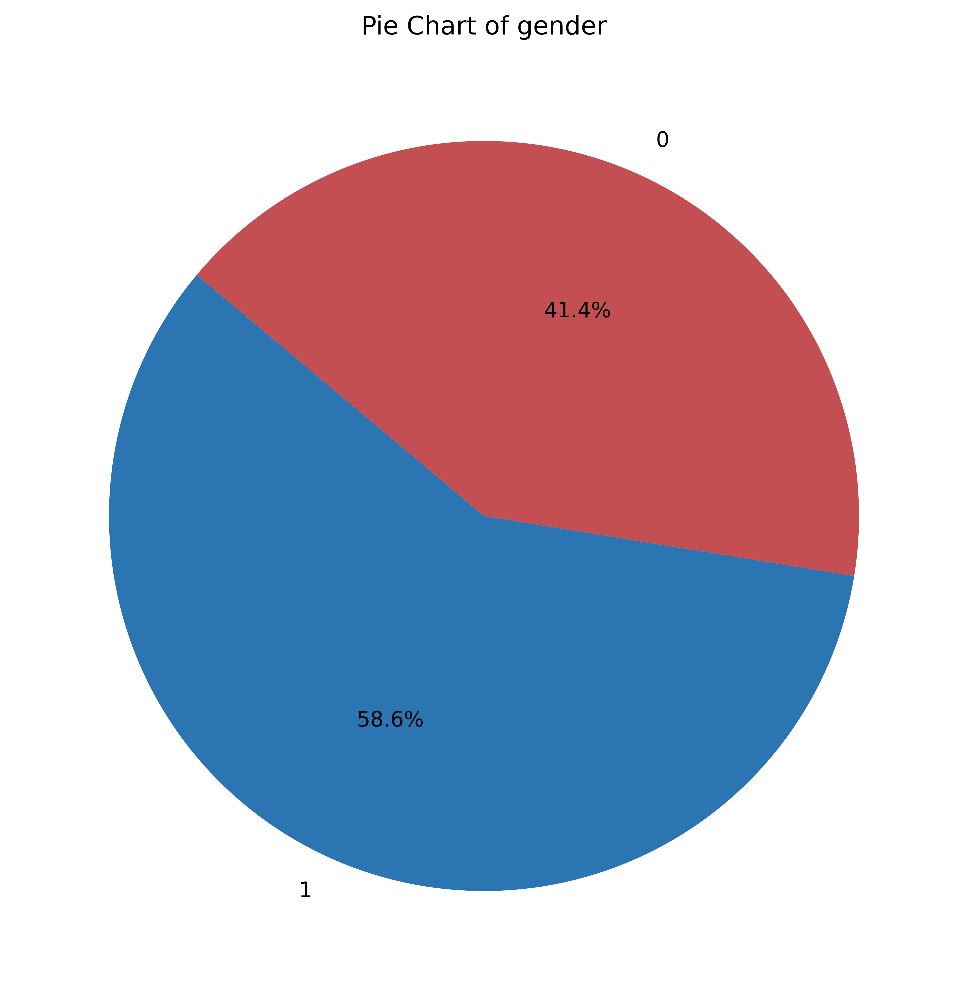

In [24]:
# Assuming "data" is your DataFrame and "column_name" is the column you want to use for the pie chart
column_name = 'gender'  # Replace 'Category' with the actual column name from your DataFrame

# Extract the data for the specified column
column_data = df[column_name]

# Calculate the counts of each category
category_counts = column_data.value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))  # Set the figure size (adjust as needed)
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140, colors=['#2a75b2', '#c44f52', 'red'])

# Customize the title
plt.title(f'Pie Chart of {column_name}')

# Show the plot
plt.gcf().set_dpi(600)
plt.show()

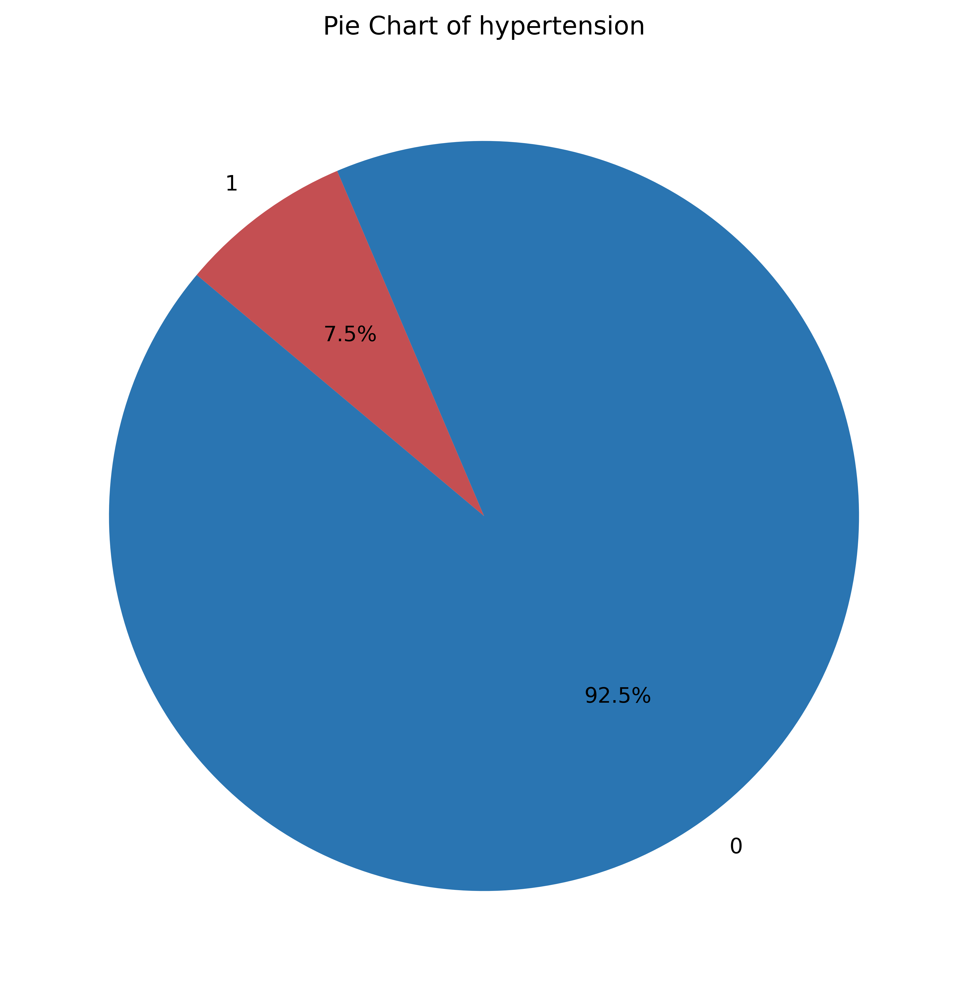

In [25]:
# Assuming "data" is your DataFrame and "column_name" is the column you want to use for the pie chart
column_name = 'hypertension'  # Replace 'Category' with the actual column name from your DataFrame

# Extract the data for the specified column
column_data = df[column_name]

# Calculate the counts of each category
category_counts = column_data.value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))  # Set the figure size (adjust as needed)
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140, colors=['#2a75b2', '#c44f52', 'red'])

# Customize the title
plt.title(f'Pie Chart of {column_name}')

# Show the plot
plt.gcf().set_dpi(600)
plt.show()

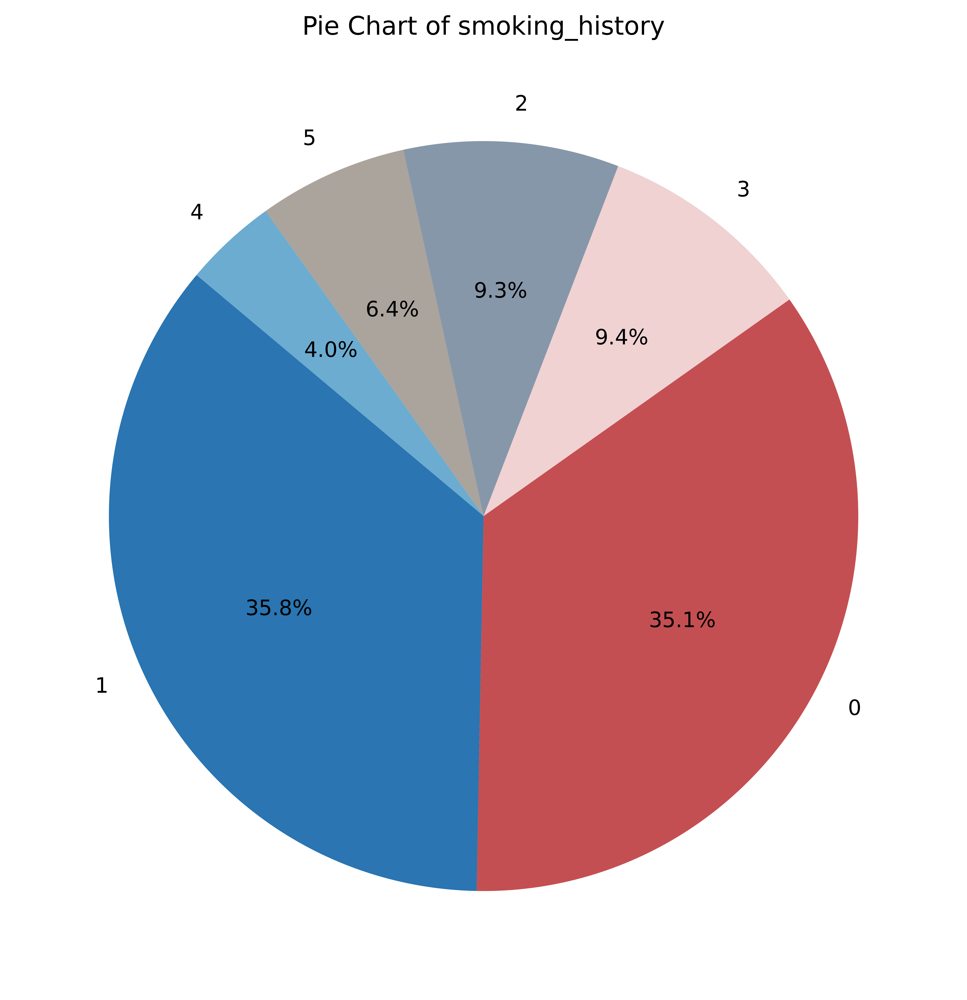

In [26]:
# Assuming "data" is your DataFrame and "column_name" is the column you want to use for the pie chart
column_name = 'smoking_history'  # Replace 'Category' with the actual column name from your DataFrame

# Extract the data for the specified column
column_data = df[column_name]

# Calculate the counts of each category
category_counts = column_data.value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))  # Set the figure size (adjust as needed)
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140, colors=['#2a75b2', '#c44f52', '#f0d2d3', '#8797aa', '#aba49c', '#6cacd1'])

# Customize the title
plt.title(f'Pie Chart of {column_name}')

# Show the plot
plt.gcf().set_dpi(1000)
plt.savefig("/kaggle/working/smoking_history.png", dpi = 1000)
plt.show()

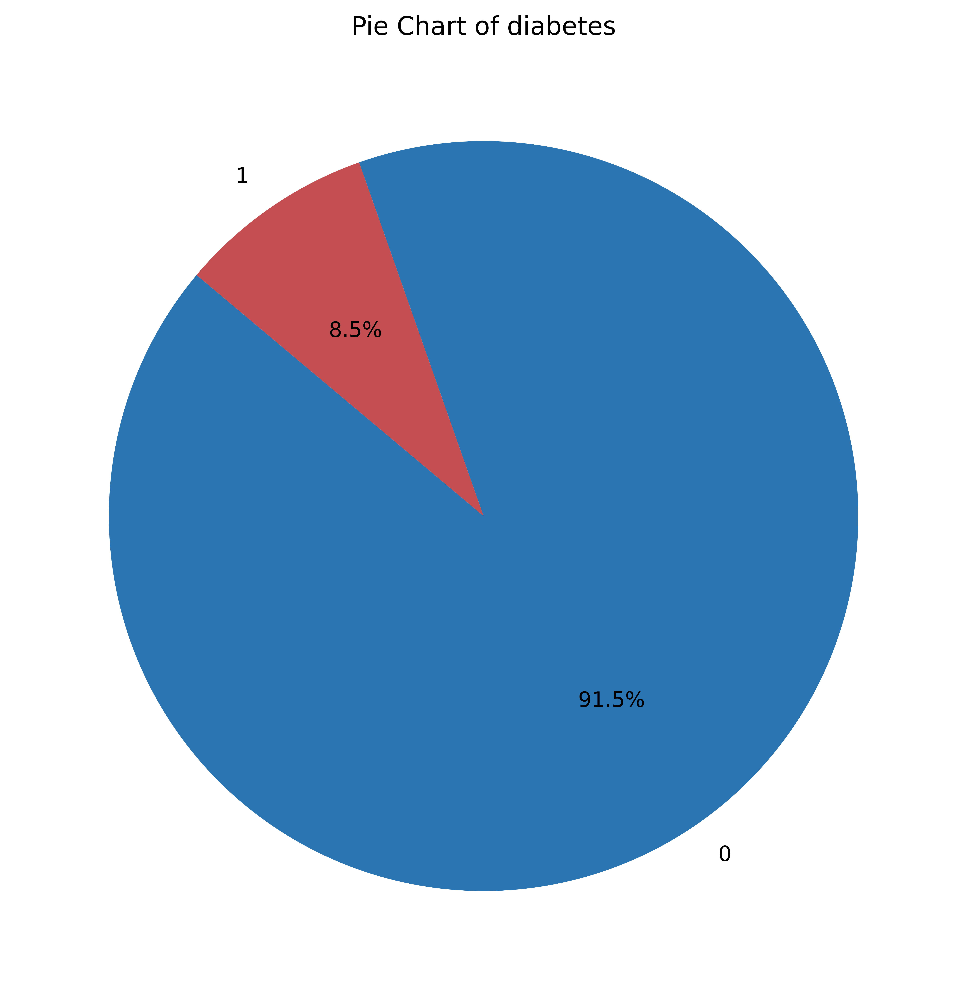

In [27]:
# Assuming "data" is your DataFrame and "column_name" is the column you want to use for the pie chart
column_name = 'diabetes'  # Replace 'Category' with the actual column name from your DataFrame

# Extract the data for the specified column
column_data = df[column_name]

# Calculate the counts of each category
category_counts = column_data.value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))  # Set the figure size (adjust as needed)
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140, colors=['#2a75b2', '#c44f52', '#f0d2d3', '#8797aa', '#aba49c', '#6cacd1'])

# Customize the title
plt.title(f'Pie Chart of {column_name}')

# Show the plot
plt.gcf().set_dpi(1000)
plt.savefig("/kaggle/working/diabetes_pie_chart.png", dpi = 1000)
plt.show()

### **Note that we haven't done ANY machine learning YET!! Data analysis is CRUCIAL before trying any models!**

### **Time for Machine Learning (ML)**

In [28]:
# We will first split our dataset into training and testing datasets.
train, test = train_test_split(df_scaled, test_size = 0.2)

In [29]:
train.head()

,age,bmi,HbA1c_level,blood_glucose_level,gender,hypertension,heart_disease,smoking_history,diabetes
99594,-0.838748,-0.000116,-0.679490,-1.303384,1,0,0,2,0
25750,-0.616691,-0.428036,-0.959689,1.521618,1,0,0,3,0
19814,0.760064,1.012428,-1.893686,0.539009,1,0,0,0,0
62069,0.315949,-1.401404,0.161108,1.521618,0,0,0,3,0
98319,-0.661102,-0.223116,1.001706,-1.426210,0,0,0,0,0


In [30]:
test.head()

,age,bmi,HbA1c_level,blood_glucose_level,gender,hypertension,heart_disease,smoking_history,diabetes
23288,0.538006,-0.000116,-1.893686,0.047704,1,0,0,1,0
15830,0.671241,-0.687199,-1.893686,0.416183,1,0,0,5,0
84981,-1.371685,-1.657553,-0.679490,0.514444,0,0,0,1,0
45481,0.626829,1.211321,0.441307,0.514444,0,0,0,0,0
41946,-0.039342,-0.000116,0.254508,-1.303384,0,0,0,3,0


In [31]:
# Split the Training and Testing Sets into covariates (X) and diabetes ground truths (y)
y_train = train["diabetes"]
X_train = train.drop(["diabetes"], axis = 1) # remove diabetes (model predictions)
y_test = test["diabetes"]
X_test = test.drop(["diabetes"], axis = 1)

In [32]:
# Train Logistic Regression Model
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

In [33]:
# Congrats, you trained a Logistic Regression Model!!! Now, time to evaluate!
# For evaluation, due to heavy class imbalance (only 8.5% of all cases had diabetes),
# we will use the Bootstrapped AUROC (area-under-receiver-operating-characteristic curve)
# Why bootstrapped? We can understand how variable our model's performance is, and we get a 95% confidence interval statistic!
from sklearn.metrics import roc_auc_score
from sklearn.utils import resample
from scipy import stats

# Define the number of bootstrap iterations
n_bootstrap = 10000  # You can adjust this number as needed, but 10000 resamples are typically enough!

# Create an empty list to store AUROC values
auroc_values = []

for _ in range(n_bootstrap):
    # Create a bootstrapped sample from x_test and y_test
    x_bootstrap, y_bootstrap = resample(X_test, y_test, random_state=np.random.randint(1, 1000))
    
    # Predict probabilities for the bootstrapped sample
    y_pred_proba = logreg.predict_proba(x_bootstrap)[:, 1]
    
    # Calculate AUROC for the bootstrapped sample
    auroc = roc_auc_score(y_bootstrap, y_pred_proba)
    
    # Append the AUROC value to the list
    auroc_values.append(auroc)

In [34]:
# We calculate the average AUROC across the model's performance through 10,000 resamples on the test set of 20,000 patients. 
# This means that the AUROC is calculated TEN THOUSAND TIMES!
mean_auroc = np.mean(auroc_values)

# Calculate the 95% confidence interval
lower_ci, upper_ci = stats.norm.interval(0.95, loc=mean_auroc, scale=np.std(auroc_values))

# Print the results
print(f"Mean AUROC: {mean_auroc:.4f}")
print(f"95% Confidence Interval: ({lower_ci:.4f}, {upper_ci:.4f})")

Mean AUROC: 0.9651
95% Confidence Interval: (0.9615, 0.9687)


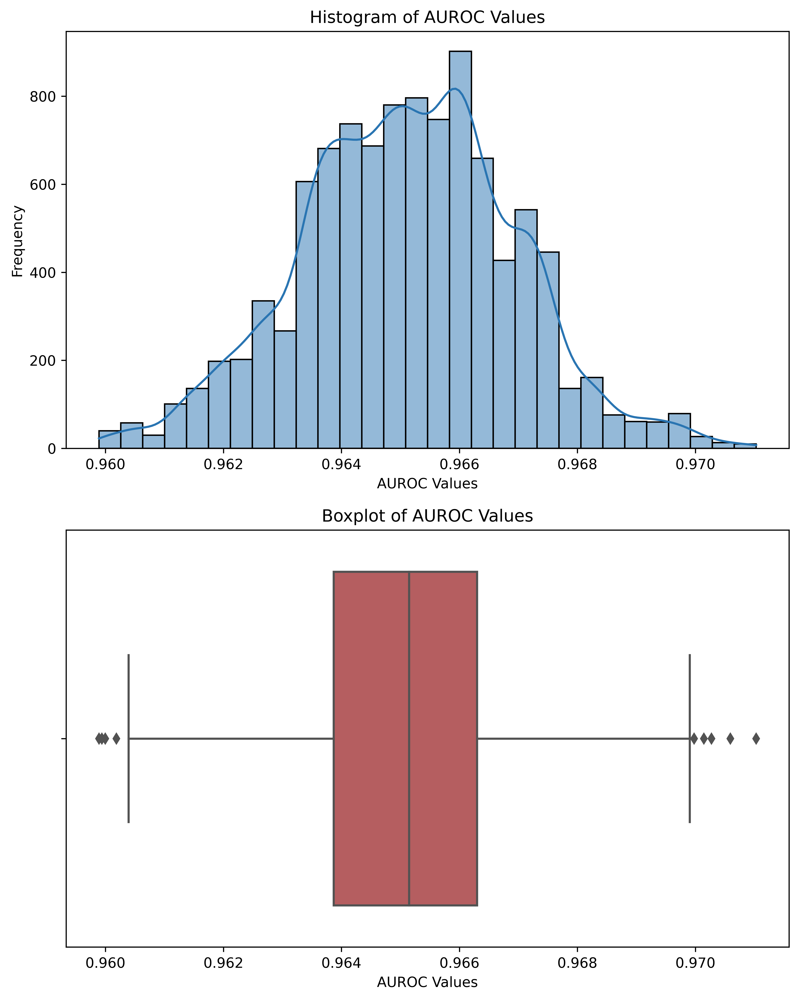

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
# Should we be using the mean or median to summarize our AUROC?
# Assuming "auroc_values" is a list containing your bootstrapped AUROC values
# Create a figure with two subplots (histogram and boxplot)
fig, axes = plt.subplots(2, 1, figsize=(8, 10))

# Plot a histogram of AUROC values
sns.histplot(auroc_values, bins=30, kde=True, color= '#2a75b2', ax=axes[0])
axes[0].set_xlabel('AUROC Values')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Histogram of AUROC Values')

# Plot a boxplot of AUROC values
sns.boxplot(x=auroc_values, color='#c44f52', ax=axes[1])
axes[1].set_xlabel('AUROC Values')
axes[1].set_title('Boxplot of AUROC Values')

# Adjust spacing between subplots
plt.tight_layout()
# Show the plot
plt.gcf().set_dpi(600)
plt.savefig("/kaggle/working/auroc_histogram_and_boxplot.png", dpi = 600)
plt.show()


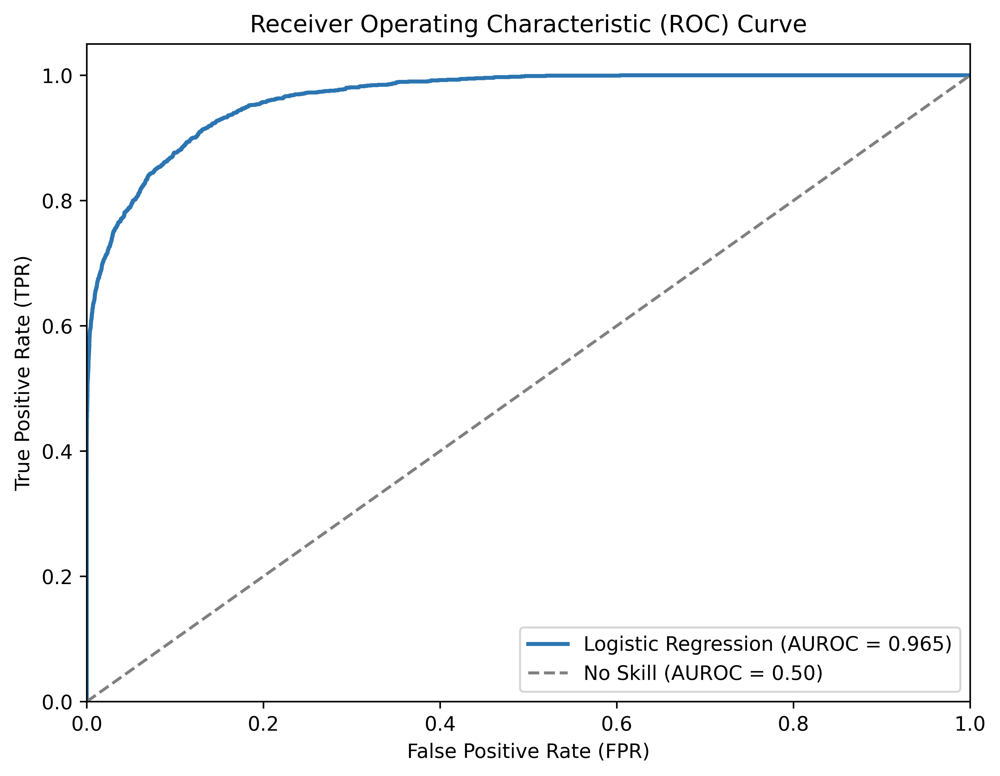

In [36]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Assuming "y_true" contains the true labels and "y_scores" contains the predicted probabilities
# for positive class (e.g., output of model.predict_proba())

# Calculate ROC curve
y_pred_proba = logreg.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate the area under the ROC curve (AUC)
roc_auc = auc(fpr, tpr)

# Create the ROC curve plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='#2a75b2', lw=2, label=f'Logistic Regression (AUROC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label = "No Skill (AUROC = 0.50)")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.gcf().set_dpi(600)

# Show the plot
plt.savefig("/kaggle/working/roc_curve.png", dpi = 600)
plt.show()

In [37]:
import numpy as np
from sklearn.metrics import confusion_matrix

# Assuming "y_true" contains the true labels (0 or 1) and "y_scores" contains predicted probabilities

# Create an array of threshold values to test
thresholds = np.arange(0.1, 1.1, 0.1)  # Adjust the range and step size as needed

# Initialize variables to track the best threshold and sensitivity
best_threshold = None
max_sensitivity = 0.0

# Loop through threshold values and calculate sensitivity for each
for threshold in thresholds:
    # Convert predicted probabilities to binary predictions based on the threshold
    y_pred = (y_pred_proba >= threshold).astype(int)
    
    # Calculate the confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    
    # Calculate sensitivity (TPR)
    sensitivity = tp / (tp + fn)
    
    # Check if this threshold maximizes sensitivity
    if sensitivity > max_sensitivity:
        max_sensitivity = sensitivity
        best_threshold = threshold

# Print the best threshold and its corresponding sensitivity
print(f"Best Threshold: {best_threshold:.2f}")
print(f"Max Sensitivity: {max_sensitivity:.2f}")


Best Threshold: 0.10
Max Sensitivity: 0.87


In [38]:
no_skill = LogisticRegression()

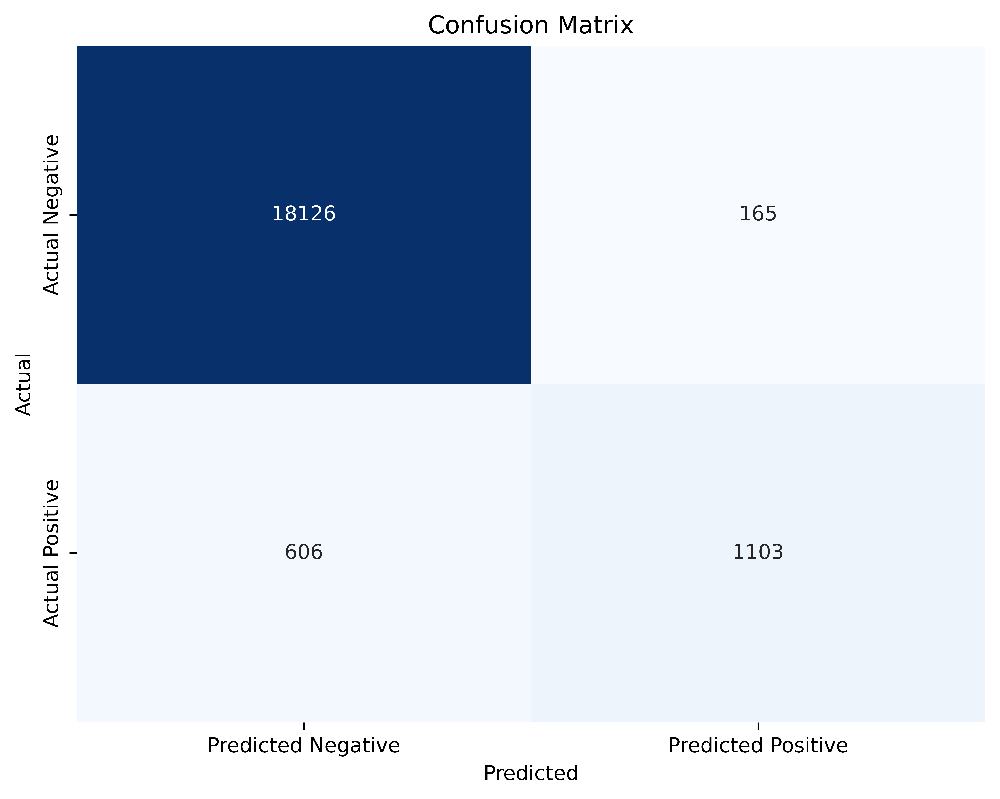

In [39]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming "y_true" contains the true labels and "y_pred" contains the predicted labels

y_pred = logreg.predict(X_test)
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Display the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.gcf().set_dpi(1000)
plt.savefig("/kaggle/working/confusion_matrix.png")
plt.show()


### Congrats, you just made a high-performing diabetes prediction model! 
A mean bootstrapped AUROC of **0.9615** is extremely high!
BUT, keep in mind that we have 148 **False Positives** and 638 **False Negatives**.

In [40]:
from statsmodels.stats.multitest import multipletests

coef_estimates = logreg.coef_[0]
std_errors = np.sqrt(np.diag(np.linalg.inv(np.dot(X_test.T, X_test))))

# Calculate Wald statistics
wald_stats = coef_estimates / std_errors

# Calculate two-tailed p-values
p_values = 2 * (1.0 - stats.norm.cdf(np.abs(wald_stats)))
_, q_values, _, _ = multipletests(p_values, method='fdr_bh')

results = pd.DataFrame({'Coefficient': coef_estimates, 'Standard Error': std_errors, 'Wald Statistic': wald_stats, 'P-Value': p_values, 'Q-Value (FDR-adjusted P-Value)': q_values}, index=X_train.columns)
print(results)

                     Coefficient  Standard Error  Wald Statistic  P-Value  \
age                     1.027150        0.007866      130.584201      0.0   
bmi                     0.607757        0.007520       80.821545      0.0   
HbA1c_level             2.463602        0.007203      342.013374      0.0   
blood_glucose_level     1.348884        0.007184      187.750724      0.0   
gender                 -0.276971        0.010688      -25.913027      0.0   
hypertension            0.785760        0.027514       28.558352      0.0   
heart_disease           0.798449        0.038456       20.762794      0.0   
smoking_history         0.042125        0.004223        9.974408      0.0   

                     Q-Value (FDR-adjusted P-Value)  
age                                             0.0  
bmi                                             0.0  
HbA1c_level                                     0.0  
blood_glucose_level                             0.0  
gender                              

### **OPTIONAL: MODEL INTERPRETABILITY (SOME REALLY COOL GRAPHS)**
What features of the data are crucial to diagnosis? Here, we'll be learning about the clinical and biological basis of diabetes detections 
by interrogating out logistic regression model and trying to understand why it is able to predict diabetes so well!

In [41]:
import shap

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [42]:
explainer = shap.Explainer(logreg, X_test)

In [43]:
sample_data = X_test.iloc[0]

In [44]:
sample_data

age                    0.538006
bmi                   -0.000116
HbA1c_level           -1.893686
blood_glucose_level    0.047704
gender                 1.000000
hypertension           0.000000
heart_disease          0.000000
smoking_history        1.000000
Name: 23288, dtype: float64

In [45]:
shap_values = explainer(X_test)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


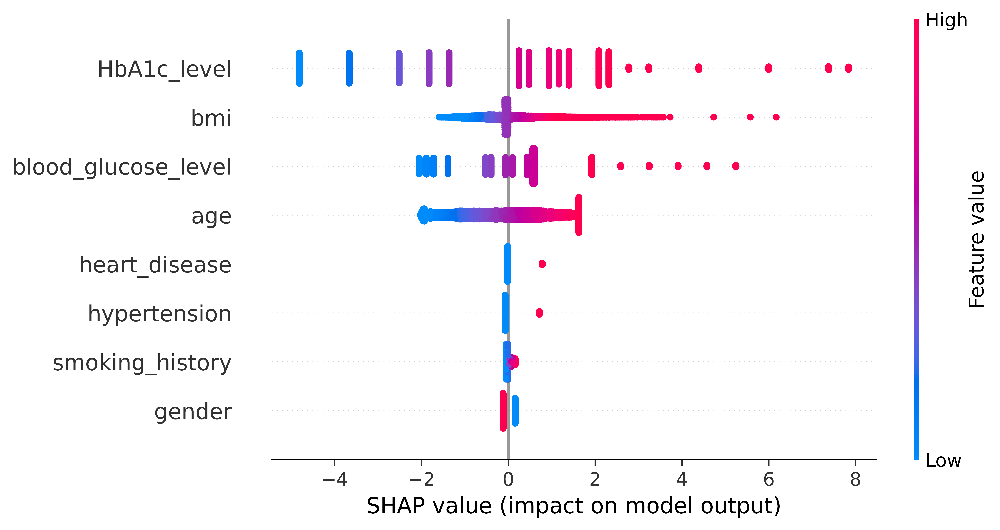

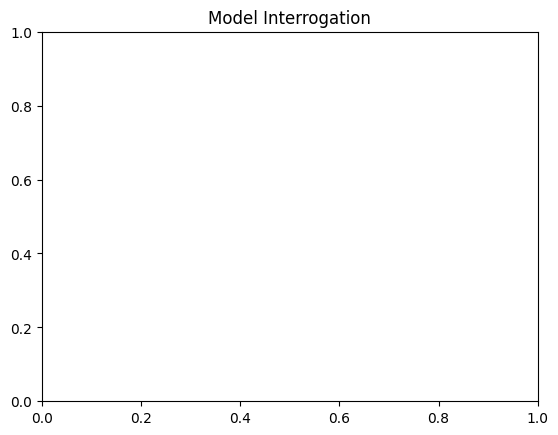

In [46]:
plt.gcf().set_dpi(1000)
shap.plots.beeswarm(shap_values, order=shap_values.abs.max(0))
plt.title("Model Interrogation")
plt.savefig("beeswarm_plot.png", dpi = 1000)
plt.show()

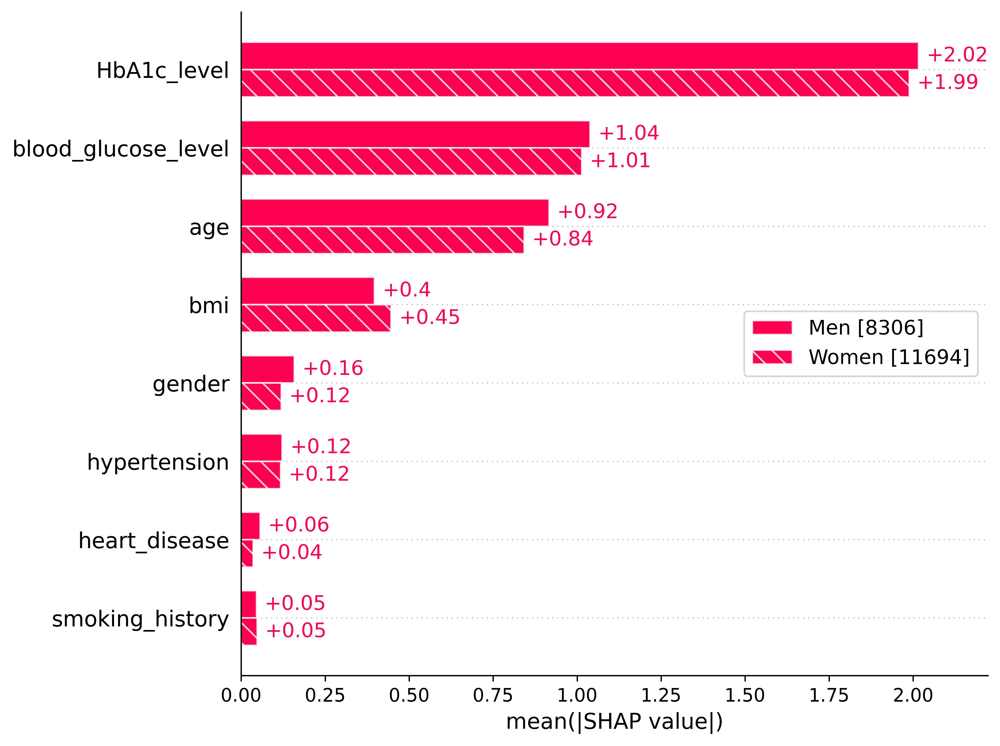

In [47]:
sex = [
    "Women" if shap_values[i, "gender"].data == 1 else "Men"
    for i in range(shap_values.shape[0])
]
plt.gcf().set_dpi(600)
shap.plots.bar(shap_values.cohorts(sex).abs.mean(0))
plt.show()

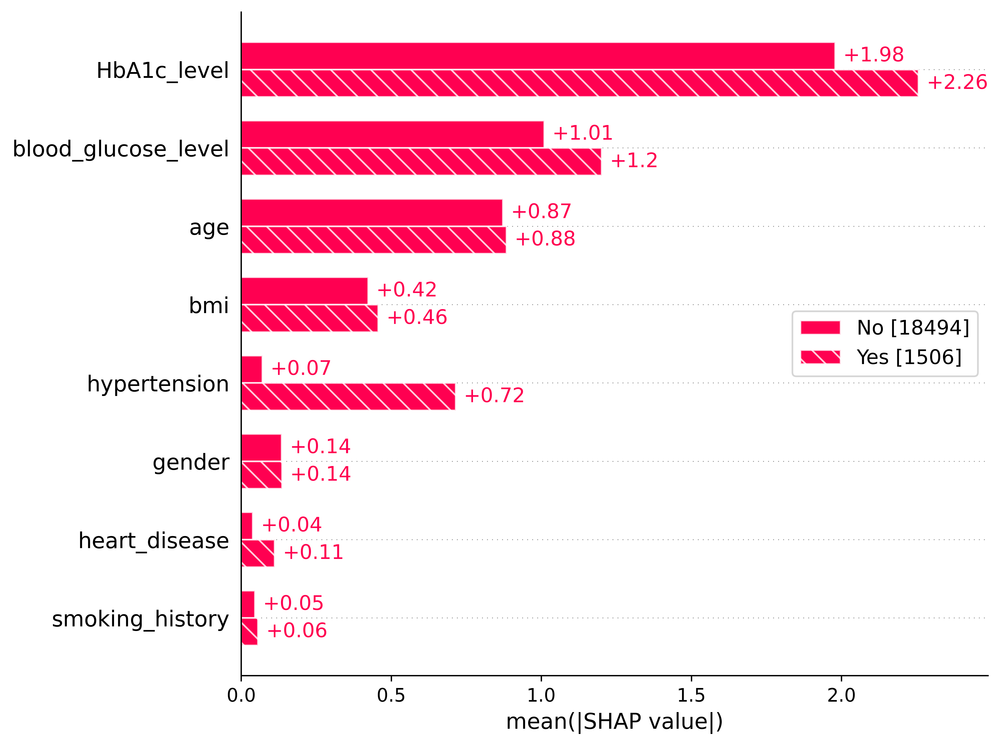

In [48]:
hypertension = [
    "Yes" if shap_values[i, "hypertension"].data == 1 else "No"
    for i in range(shap_values.shape[0])
]
plt.gcf().set_dpi(600)
shap.plots.bar(shap_values.cohorts(hypertension).abs.mean(0))